# CS436 Week 1 Deliverable: Feature Matching

**Name:** Rayan Atif, Asad Ayub

**Student ID:** 26100166, 27100413

1.  Loading and preprocessing our captured image dataset.
2.  Displaying a grid of 10-12 example images.
3.  Detecting and matching features between 4 consecutive image pairs (using SIFT and Lowe's Ratio Test).

## 1. Setup and Imports
* `cv2` (OpenCV) for all computer vision tasks.
* `numpy` for numerical operations.
* `matplotlib.pyplot` for displaying images in the notebook.
* `glob` to find our image files.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

plt.rcParams['figure.figsize'] = (15, 10)

print("Libraries imported.")

Libraries imported.


## 2. Image Loading and Preprocessing

**Preprocessing:**
Resize all images to a consistent width (800px) while maintaining their aspect ratio.

In [2]:
def load_and_resize(image_path, width=800):
    """
    Loads an image from a file path and resizes it to a fixed width
    while maintaining the aspect ratio.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Could not read image {image_path}. Skipping.")
        return None

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    (h, w) = image.shape[:2]
    r = width / float(w)
    dim = (width, int(h * r))

    resized = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    return resized

image_folder = 'dataset'
image_files = sorted(glob.glob(os.path.join(image_folder, 'img_*.jpeg')))
images = [load_and_resize(f) for f in image_files if f is not None]

print(f"Loaded {len(images)} images.")

Loaded 60 images.


## 3. Deliverable: Image Grid
12 example images from our captured dataset, shown in a grid.

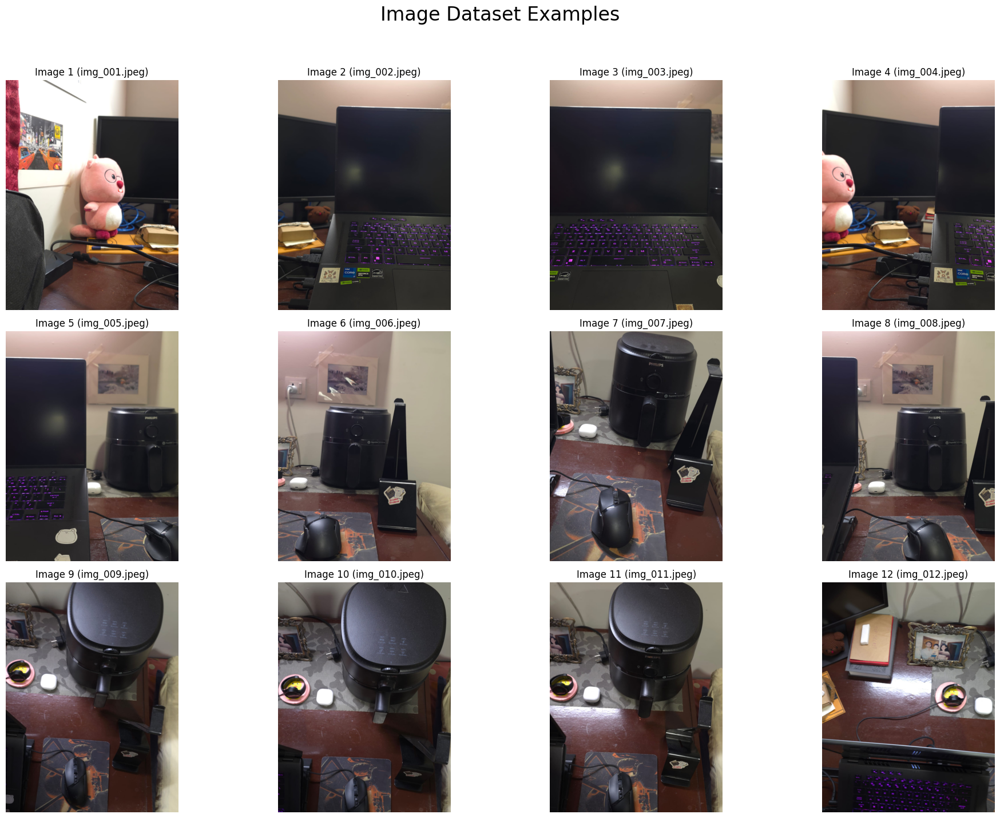

In [3]:
num_images = min(len(images), 12)
rows = 3
cols = 4

fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
fig.suptitle("Image Dataset Examples", fontsize=24)

axes = axes.flatten()

for i in range(num_images):
    axes[i].imshow(images[i])
    axes[i].set_title(f"Image {i+1} ({os.path.basename(image_files[i])})")
    axes[i].axis('off')

for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## 4. Deliverable: Consecutive Feature Matching
We will use the **SIFT** detector and filter the matches using **Lowe's Ratio Test**.

In [4]:
def find_and_filter_matches(img1_rgb, img2_rgb):
    """
    Finds and filters SIFT feature matches between two images
    using Lowe's Ratio Test.
    """
    gray1 = cv2.cvtColor(img1_rgb, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(img2_rgb, cv2.COLOR_RGB2GRAY)

    sift = cv2.SIFT_create()

    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)

    bf = cv2.BFMatcher(cv2.NORM_L2)

    good_matches = []
    if des1 is None or des2 is None:
        return kp1, kp2, []

    try:
        matches = bf.knnMatch(des1, des2, k=2)

        good_ratio = 0.7
        for m, n in matches:
            if m.distance < good_ratio * n.distance:
                good_matches.append(m)

    except cv2.error:
        pass

    return kp1, kp2, good_matches

def draw_matches(img1, kp1, img2, kp2, matches):
    """Draws the filtered matches."""
    img1_bgr = cv2.cvtColor(img1, cv2.COLOR_RGB2BGR)
    img2_bgr = cv2.cvtColor(img2, cv2.COLOR_RGB2BGR)

    img_matches = cv2.drawMatches(
        img1_bgr, kp1,
        img2_bgr, kp2,
        matches,
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    img_matches = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)
    return img_matches

print("Helper functions defined.")

Helper functions defined.


### Matching Results
Here are the matching results for 4 consecutive pairs of images.

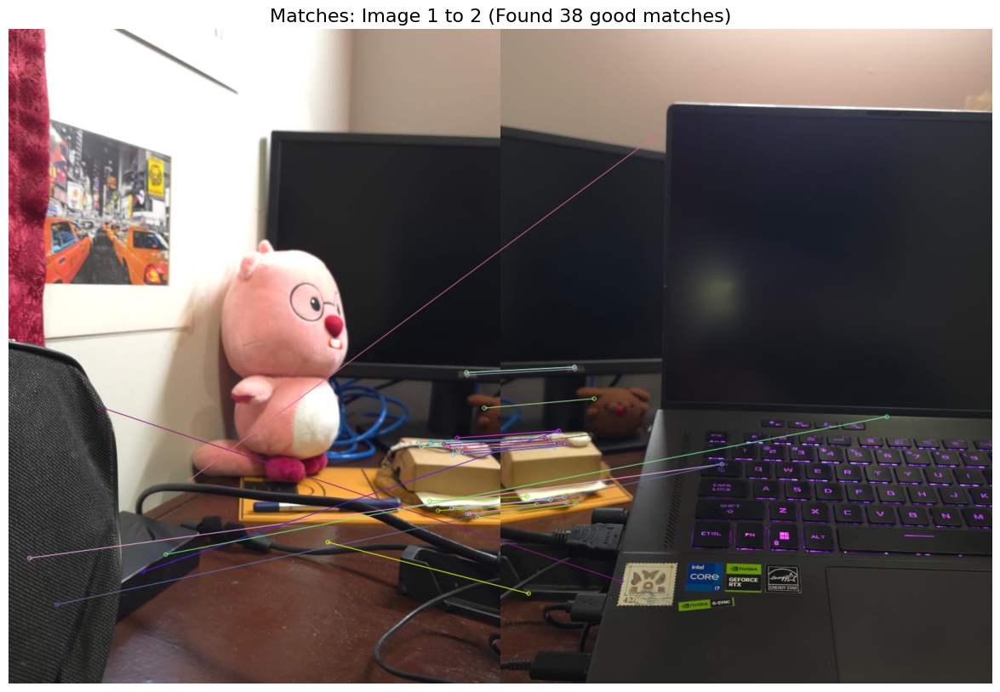

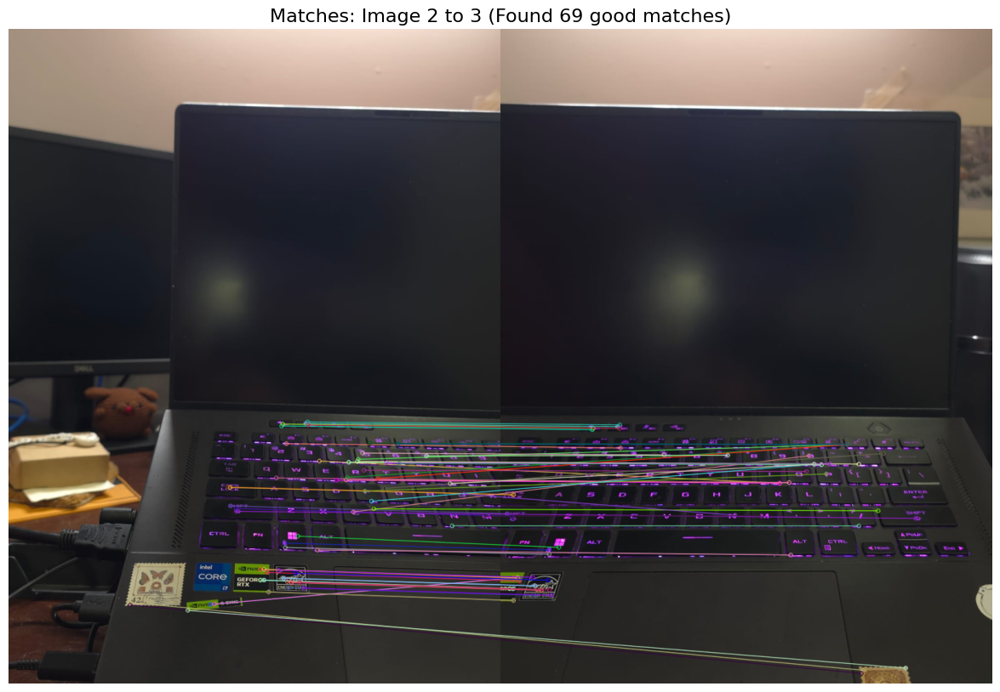

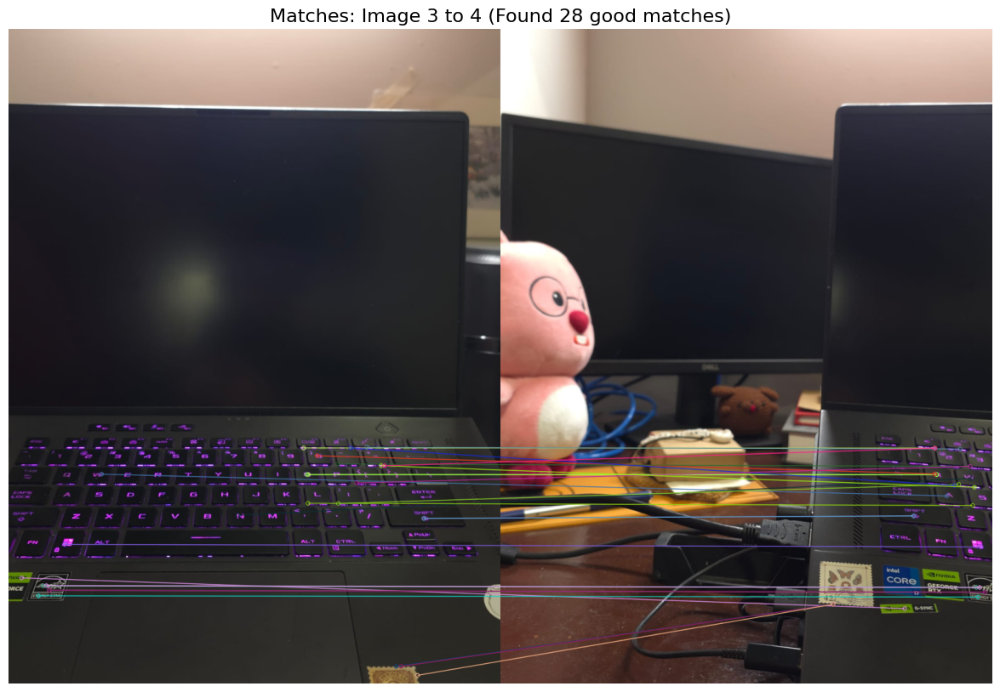

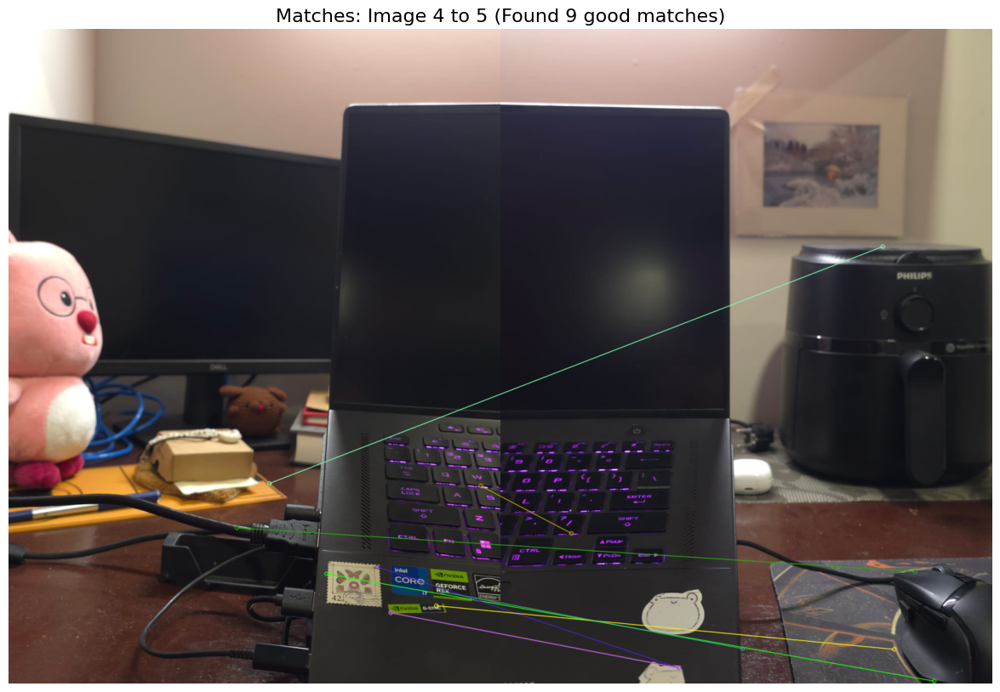

In [5]:
num_pairs = 4

if len(images) >= num_pairs + 1:
    for i in range(num_pairs):
        img1 = images[i]
        img2 = images[i+1]

        kp1, kp2, good_matches = find_and_filter_matches(img1, img2)

        match_visualization = draw_matches(img1, kp1, img2, kp2, good_matches)

        plt.figure(figsize=(20, 10))
        plt.imshow(match_visualization)
        plt.title(f"Matches: Image {i+1} to {i+2} (Found {len(good_matches)} good matches)", fontsize=16)
        plt.axis('off')
        plt.show()
else:
    print(f"Not enough pairs.")

# CS436 Week 2 Deliverable: Two-View Reconstruction Pipeline

**Name:** Rayan Atif, Asad Ayub

**Student ID:** 26100166, 27100413




### 1. Finding the Ideal Image Pair

According to the requirements, we need to find two images with **sufficient parallax** (camera translation, not just rotation).
We'll search through multiple pairs with different gaps to find the best one based on:
- Number of good feature matches
- Number of inliers after Essential Matrix estimation  
- Number of valid triangulated 3D points (cheirality check)

This ensures we select a pair with good baseline and successful reconstruction.

### Helper Functions for Two-View Reconstruction

The following functions implement the core components of the two-view reconstruction pipeline:
- `save_ply()`: Saves 3D point clouds to PLY format
- `get_matches()`: Detects and matches SIFT features using Lowe's ratio test
- `triangulate_and_check()`: Triangulates 3D points and performs cheirality check
- `evaluate_pair()`: Evaluates a pair of images for reconstruction quality


### 2. Searching for the Best Image Pair

We systematically search through multiple image pairs with different gaps to find the optimal pair for reconstruction.


In [6]:
def save_ply(filename, points_3d, colors=None):
    """Save 3D point cloud to PLY format - matching the provided implementation."""
    points_3d = np.array(points_3d)

    if colors is not None:
        colors = np.array(colors)
    else:
        colors = np.zeros_like(points_3d)

    with open(filename, 'w') as f:
        f.write("ply\nformat ascii 1.0\n")
        f.write(f"element vertex {len(points_3d)}\n")
        f.write("property float x\nproperty float y\nproperty float z\n")
        f.write("property uchar red\nproperty uchar green\nproperty uchar blue\n")
        f.write("end_header\n")

        for p, c in zip(points_3d, colors):
            # Note: BGR order (c[2], c[1], c[0]) as in provided code
            f.write(f"{p[0]} {p[1]} {p[2]} {int(c[2])} {int(c[1])} {int(c[0])}\n")

def get_matches(img1, img2):
    """Get SIFT feature matches between two images using Lowe's ratio test."""
    # Convert RGB to grayscale if needed
    if len(img1.shape) == 3:
        gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY) if img1.dtype != np.uint8 or img1.shape[2] == 3 else img1
    else:
        gray1 = img1
    if len(img2.shape) == 3:
        gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY) if img2.dtype != np.uint8 or img2.shape[2] == 3 else img2
    else:
        gray2 = img2

    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)

    if des1 is None or des2 is None:
        return None, None, [], None, None

    bf = cv2.BFMatcher()  # As in provided code
    matches = bf.knnMatch(des1, des2, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

    pts1 = np.float32([kp1[m.queryIdx].pt for m in good_matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good_matches])

    return pts1, pts2, good_matches, kp1, kp2

def triangulate_and_check(R, t, pts1, pts2, K):
    """Triangulate points and check cheirality - matching provided implementation."""
    P0 = K @ np.hstack((np.eye(3), np.zeros((3, 1))))
    P1 = K @ np.hstack((R, t))

    pts4d_h = cv2.triangulatePoints(P0, P1, pts1.T, pts2.T)
    pts4d = pts4d_h[:3] / pts4d_h[3]

    z1 = pts4d[2]
    z2 = (R @ pts4d + t.reshape(3, 1))[2]
    count_front = np.sum((z1 > 0) & (z2 > 0))

    return pts4d.T, count_front

def evaluate_pair(img1, img2, idx1, idx2):
    """
    Evaluate a pair of images for reconstruction quality.
    Returns: (num_matches, num_inliers, num_valid_3d, success, data)
    """
    # Get matches
    pts1, pts2, good_matches, kp1, kp2 = get_matches(img1, img2)

    if pts1 is None or len(good_matches) < 8:
        return 0, 0, 0, False, None

    # Build intrinsic matrix K - matching provided code style
    h, w = img1.shape[:2]
    fx = fy = w
    cx = w / 2
    cy = h / 2
    K = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])

    # Estimate Essential Matrix
    try:
        E, mask = cv2.findEssentialMat(
            pts1, pts2,
            K,
            method=cv2.RANSAC,
            prob=0.999,
            threshold=1.0
        )
        if E is None:
            return len(good_matches), 0, 0, False, None
    except:
        return len(good_matches), 0, 0, False, None

    # Get inliers
    pts1_inliers = pts1[mask.ravel() == 1]
    pts2_inliers = pts2[mask.ravel() == 1]
    num_inliers = pts1_inliers.shape[0]

    if num_inliers < 8:
        return len(good_matches), num_inliers, 0, False, None

    # Decompose Essential Matrix
    try:
        R1, R2, t = cv2.decomposeEssentialMat(E)
    except:
        return len(good_matches), num_inliers, 0, False, None

    # Check all 4 possible poses - matching provided code style
    poses = [(R1, t), (R1, -t), (R2, t), (R2, -t)]
    best_pts = None
    best_count = -1
    best_pose = None

    for R, t_vec in poses:
        pts3d, count = triangulate_and_check(R, t_vec, pts1_inliers, pts2_inliers, K)
        if count > best_count:
            best_count = count
            best_pts = pts3d
            best_pose = (R, t_vec)

    if best_count > 0:
        return len(good_matches), num_inliers, best_count, True, {
            'R': best_pose[0], 't': best_pose[1],
            'points_3d': best_pts,
            'pts1_inliers': pts1_inliers, 'pts2_inliers': pts2_inliers,
            'kp1': kp1, 'kp2': kp2,
            'good_matches': good_matches, 'E': E, 'K': K
        }
    else:
        return len(good_matches), num_inliers, 0, False, None

print("Helper functions defined.")


Helper functions defined.


In [7]:
# Search through multiple pairs to find the best one
# We'll try different gaps between images to find sufficient parallax

print("Searching for the best image pair...")
print("=" * 60)

# Try different gaps: too small = insufficient parallax, too large = poor matching
gaps_to_try = [5, 10, 15, 20, 25, 30, 35, 40]
results = []

for gap in gaps_to_try:
    for start_idx in range(len(images) - gap):
        idx1 = start_idx
        idx2 = start_idx + gap

        img1 = images[idx1]
        img2 = images[idx2]

        num_matches, num_inliers, num_valid_3d, success, data = evaluate_pair(img1, img2, idx1, idx2)

        if success:
            # Score: prioritize valid 3D points, then inliers, then matches
            score = num_valid_3d * 1000 + num_inliers * 10 + num_matches
            results.append({
                'idx1': idx1, 'idx2': idx2, 'gap': gap,
                'num_matches': num_matches, 'num_inliers': num_inliers,
                'num_valid_3d': num_valid_3d, 'score': score, 'data': data
            })
            print(f"Pair ({idx1:2d}, {idx2:2d}) gap={gap:2d}: "
                  f"{num_matches:3d} matches, {num_inliers:3d} inliers, "
                  f"{num_valid_3d:3d} valid 3D points ✓")

if not results:
    print("\nNo successful pairs found! Trying all pairs with smaller gaps...")
    # Fallback: try smaller gaps
    for gap in range(3, 10):
        for start_idx in range(len(images) - gap):
            idx1 = start_idx
            idx2 = start_idx + gap
            img1 = images[idx1]
            img2 = images[idx2]
            num_matches, num_inliers, num_valid_3d, success, data = evaluate_pair(img1, img2, idx1, idx2)
            if success:
                score = num_valid_3d * 1000 + num_inliers * 10 + num_matches
                results.append({
                    'idx1': idx1, 'idx2': idx2, 'gap': gap,
                    'num_matches': num_matches, 'num_inliers': num_inliers,
                    'num_valid_3d': num_valid_3d, 'score': score, 'data': data
                })

if results:
    # Sort by score (best first)
    results.sort(key=lambda x: x['score'], reverse=True)
    best_pair = results[0]

    print("\n" + "=" * 60)
    print("BEST PAIR SELECTED:")
    print(f"  Images: {best_pair['idx1']} and {best_pair['idx2']} (gap={best_pair['gap']})")
    print(f"  Matches: {best_pair['num_matches']}")
    print(f"  Inliers: {best_pair['num_inliers']}")
    print(f"  Valid 3D Points: {best_pair['num_valid_3d']}")
    print("=" * 60)

    # Store best pair data
    best_idx1 = best_pair['idx1']
    best_idx2 = best_pair['idx2']
    best_img1 = images[best_idx1]
    best_img2 = images[best_idx2]
    reconstruction_data = best_pair['data']
else:
    print("\nERROR: Could not find any suitable pair. Using fallback pair (0, 20).")
    best_idx1 = 0
    best_idx2 = min(20, len(images) - 1)
    best_img1 = images[best_idx1]
    best_img2 = images[best_idx2]

    # Evaluate the fallback pair
    num_matches, num_inliers, num_valid_3d, success, reconstruction_data = evaluate_pair(
        best_img1, best_img2, best_idx1, best_idx2)

    if not success:
        print("WARNING: Fallback pair also failed. Reconstruction may not work properly.")


Searching for the best image pair...
Pair ( 5, 10) gap= 5:  21 matches,  12 inliers,  12 valid 3D points ✓
Pair ( 6, 11) gap= 5:  13 matches,   8 inliers,   7 valid 3D points ✓
Pair ( 9, 14) gap= 5: 281 matches, 235 inliers, 235 valid 3D points ✓
Pair (10, 15) gap= 5:  15 matches,  10 inliers,   4 valid 3D points ✓
Pair (11, 16) gap= 5:  16 matches,  13 inliers,  13 valid 3D points ✓
Pair (12, 17) gap= 5:  15 matches,   8 inliers,   8 valid 3D points ✓
Pair (13, 18) gap= 5:  24 matches,  15 inliers,   7 valid 3D points ✓
Pair (14, 19) gap= 5:  23 matches,  15 inliers,  13 valid 3D points ✓
Pair (15, 20) gap= 5:  56 matches,  30 inliers,  30 valid 3D points ✓
Pair (17, 22) gap= 5:  12 matches,   8 inliers,   4 valid 3D points ✓
Pair (18, 23) gap= 5: 186 matches, 134 inliers, 134 valid 3D points ✓
Pair (19, 24) gap= 5:  11 matches,   8 inliers,   5 valid 3D points ✓
Pair (22, 27) gap= 5:  42 matches,  25 inliers,  24 valid 3D points ✓
Pair (23, 28) gap= 5:  14 matches,   9 inliers,   5 v

### 3. Display the Two Images Used for Reconstruction

The following images were selected as the best pair for two-view reconstruction based on our search criteria.


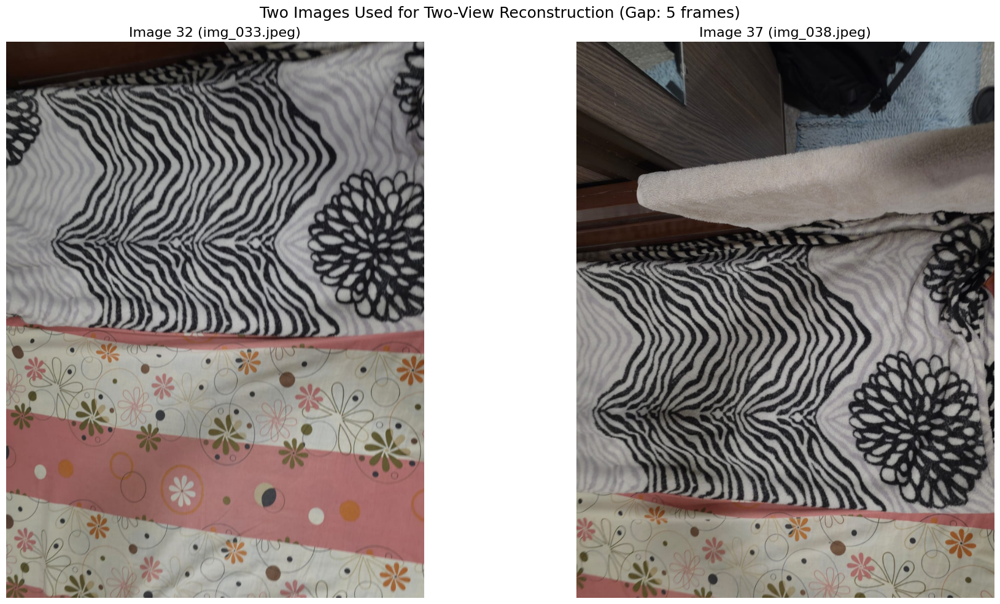

In [8]:
# Display the two images used for reconstruction
if 'best_img1' in globals() and 'best_img2' in globals() and 'best_idx1' in globals() and 'best_idx2' in globals():
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    axes[0].imshow(best_img1)
    axes[0].set_title(f"Image {best_idx1} ({os.path.basename(image_files[best_idx1])})", fontsize=16)
    axes[0].axis('off')

    axes[1].imshow(best_img2)
    axes[1].set_title(f"Image {best_idx2} ({os.path.basename(image_files[best_idx2])})", fontsize=16)
    axes[1].axis('off')

    plt.suptitle(f"Two Images Used for Two-View Reconstruction (Gap: {best_idx2 - best_idx1} frames)",
                 fontsize=18, y=0.98)
    plt.tight_layout()
    plt.show()
else:
    print("Best pair not yet selected. Run the search cell first.")


### 4. Visualization and Results


### Final Reconstruction and PLY Export

Perform the final reconstruction with the selected best pair and save the colored point cloud to PLY format.


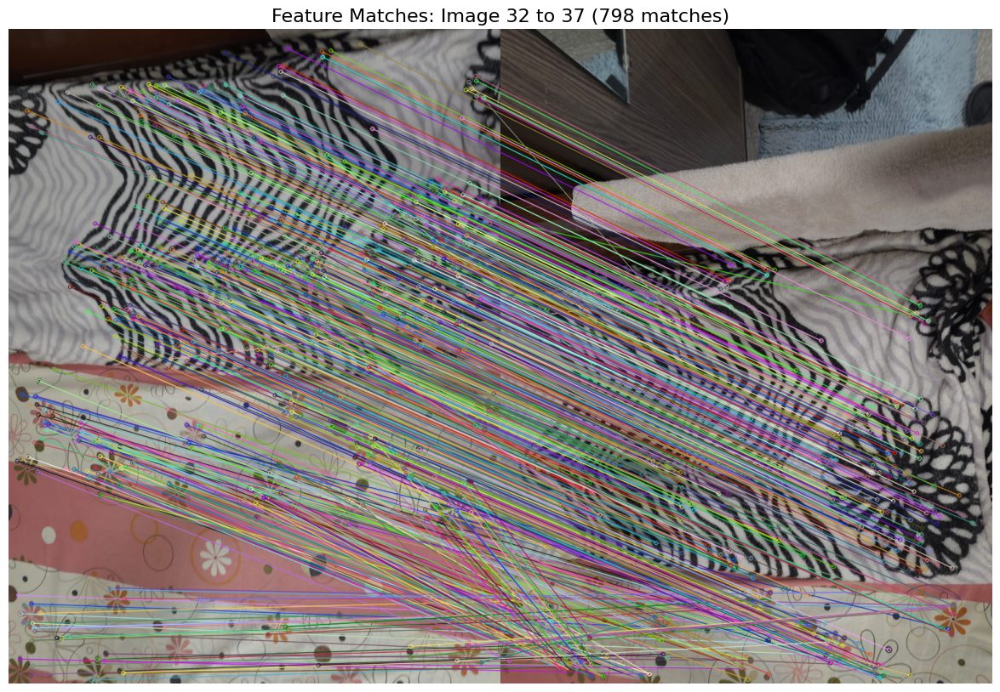


Intrinsic Matrix K:
[[800.   0. 400.]
 [  0. 800. 533.]
 [  0.   0.   1.]]

Essential Matrix E:
[[-0.01618381 -0.00096369 -0.70413871]
 [ 0.02359531  0.0036678  -0.06318016]
 [ 0.69870969  0.10475609 -0.01395816]]

Rotation Matrix R:
[[ 0.99793146  0.06002462 -0.02301844]
 [-0.0591789   0.99760477  0.035813  ]
 [ 0.02511297 -0.03437671  0.99909338]]

Translation Vector t:
[[-0.08860955]
 [ 0.99542762]
 [-0.03566783]]

Valid 3D Points: 3


In [9]:
# Visualize matches for the best pair
if reconstruction_data:
    match_img = cv2.drawMatches(
        cv2.cvtColor(best_img1, cv2.COLOR_RGB2BGR), reconstruction_data['kp1'],
        cv2.cvtColor(best_img2, cv2.COLOR_RGB2BGR), reconstruction_data['kp2'],
        reconstruction_data['good_matches'], None, flags=2
    )

    plt.figure(figsize=(20, 10))
    plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Feature Matches: Image {best_idx1} to {best_idx2} "
              f"({len(reconstruction_data['good_matches'])} matches)", fontsize=16)
    plt.axis('off')
    plt.show()

    # Display Essential Matrix and pose
    print(f"\nIntrinsic Matrix K:\n{reconstruction_data['K']}")
    print(f"\nEssential Matrix E:\n{reconstruction_data['E']}")
    print(f"\nRotation Matrix R:\n{reconstruction_data['R']}")
    print(f"\nTranslation Vector t:\n{reconstruction_data['t']}")
    print(f"\nValid 3D Points: {reconstruction_data['points_3d'].shape[1]}")
else:
    print("No reconstruction data available to visualize.")


### 5.3 Save Point Cloud to PLY


### 3D Point Cloud Visualization

Visualize the reconstructed 3D point cloud in 3D space.


In [10]:
# 3D Visualization of the point cloud
if 'best_pts' in globals() and best_pts is not None:
    from mpl_toolkits.mplot3d import Axes3D

    fig = plt.figure(figsize=(15, 12))
    ax = fig.add_subplot(111, projection='3d')

    # Extract x, y, z coordinates
    x = best_pts[:, 0]
    y = best_pts[:, 1]
    z = best_pts[:, 2]

    # Use colors if available, otherwise use z-coordinate for coloring
    if 'colors' in globals() and colors is not None and len(colors) > 0:
        # Convert BGR to RGB for display
        colors_rgb = colors[:, [2, 1, 0]] / 255.0
        ax.scatter(x, y, z, c=colors_rgb, s=20, alpha=0.6)
    else:
        ax.scatter(x, y, z, c=z, cmap='viridis', s=20, alpha=0.6)

    ax.set_xlabel('X', fontsize=12)
    ax.set_ylabel('Y', fontsize=12)
    ax.set_zlabel('Z', fontsize=12)
    ax.set_title('3D Point Cloud Visualization', fontsize=16, pad=20)

    # Set equal aspect ratio
    max_range = np.array([x.max()-x.min(), y.max()-y.min(), z.max()-z.min()]).max() / 2.0
    mid_x = (x.max()+x.min()) * 0.5
    mid_y = (y.max()+y.min()) * 0.5
    mid_z = (z.max()+z.min()) * 0.5
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)

    plt.tight_layout()
    plt.show()

    print(f"Displayed {len(best_pts)} 3D points")
else:
    print("3D point cloud not available. Run the reconstruction cell first.")


3D point cloud not available. Run the reconstruction cell first.


### 2D Scatter Plots of 3D Point Cloud

Visualize the 3D point cloud projected onto 2D planes (XY, XZ, YZ projections).


In [11]:
# 2D Scatter plots of the 3D point cloud
if 'best_pts' in globals() and best_pts is not None:
    x = best_pts[:, 0]
    y = best_pts[:, 1]
    z = best_pts[:, 2]

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # XY projection
    if 'colors' in globals() and colors is not None and len(colors) > 0:
        colors_rgb = colors[:, [2, 1, 0]] / 255.0
        axes[0].scatter(x, y, c=colors_rgb, s=10, alpha=0.6)
        axes[1].scatter(x, z, c=colors_rgb, s=10, alpha=0.6)
        axes[2].scatter(y, z, c=colors_rgb, s=10, alpha=0.6)
    else:
        axes[0].scatter(x, y, c=z, cmap='viridis', s=10, alpha=0.6)
        axes[1].scatter(x, z, c=y, cmap='viridis', s=10, alpha=0.6)
        axes[2].scatter(y, z, c=x, cmap='viridis', s=10, alpha=0.6)

    axes[0].set_xlabel('X', fontsize=12)
    axes[0].set_ylabel('Y', fontsize=12)
    axes[0].set_title('XY Projection', fontsize=14)
    axes[0].grid(True, alpha=0.3)
    axes[0].set_aspect('equal', adjustable='box')

    axes[1].set_xlabel('X', fontsize=12)
    axes[1].set_ylabel('Z', fontsize=12)
    axes[1].set_title('XZ Projection', fontsize=14)
    axes[1].grid(True, alpha=0.3)
    axes[1].set_aspect('equal', adjustable='box')

    axes[2].set_xlabel('Y', fontsize=12)
    axes[2].set_ylabel('Z', fontsize=12)
    axes[2].set_title('YZ Projection', fontsize=14)
    axes[2].grid(True, alpha=0.3)
    axes[2].set_aspect('equal', adjustable='box')

    plt.suptitle('2D Scatter Plots of 3D Point Cloud', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

    print(f"Displayed 2D projections of {len(best_pts)} 3D points")
else:
    print("3D point cloud not available. Run the reconstruction cell first.")


3D point cloud not available. Run the reconstruction cell first.


In [12]:
# Perform final reconstruction with the best pair
# This matches the provided code's output format

if reconstruction_data:
    # Re-run the reconstruction to get the exact output format
    pts1, pts2, good_matches, kp1, kp2 = get_matches(best_img1, best_img2)

    print("Good matches:", len(good_matches))

    # Build K matrix
    h, w = best_img1.shape[:2]
    fx = fy = w
    cx = w / 2
    cy = h / 2
    K = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])

    # Essential Matrix
    E, mask = cv2.findEssentialMat(
        pts1, pts2,
        K,
        method=cv2.RANSAC,
        prob=0.999,
        threshold=1.0
    )

    pts1 = pts1[mask.ravel() == 1]
    pts2 = pts2[mask.ravel() == 1]

    # Decompose Essential Matrix
    R1, R2, t = cv2.decomposeEssentialMat(E)
    poses = [(R1, t), (R1, -t), (R2, t), (R2, -t)]

    P0 = K @ np.hstack((np.eye(3), np.zeros((3, 1))))

    best_pts = None
    best_count = -1

    for i, (R, t_vec) in enumerate(poses):
        pts3d, count = triangulate_and_check(R, t_vec, pts1, pts2, K)
        print(f"Pose {i+1}: {count} points in front")
        if count > best_count:
            best_count = count
            best_pts = pts3d

    print("Chosen pose has", best_count, "points in front.")

    # Save point cloud - matching provided code format
    save_ply("pointcloud.ply", best_pts)
    print("Saved sparse 3D cloud to pointcloud.ply")
else:
    print("ERROR: Cannot perform reconstruction - no suitable pair found.")


Good matches: 798
Pose 1: 0 points in front
Pose 2: 0 points in front
Pose 3: 0 points in front
Pose 4: 505 points in front
Chosen pose has 505 points in front.
Saved sparse 3D cloud to pointcloud.ply


# CS436 Week 3 Deliverable: Multi-View SfM & Refinement

**Name:** Rayan Atif, Asad Ayub

**Student ID:** 26100166, 27100413

**Objective:** Extend the two-view reconstruction to a full multi-view Structure-from-Motion pipeline using incremental PnP, observe drift, and apply bundle adjustment refinement.


In [18]:
from scipy.optimize import least_squares

class CameraPose:
    def __init__(self, R=np.eye(3), t=np.zeros((3, 1))):
        self.R = R
        self.t = t

class MapPoint:
    def __init__(self, xyz, color=None):
        self.xyz = np.asarray(xyz, dtype=np.float64).reshape(3)
        self.color = color if color is not None else np.array([128, 128, 128])

def rvec_tvec_from_pose(R, t):
    rvec, _ = cv2.Rodrigues(R)
    return rvec, t.reshape(3, 1)

def pose_from_rvec_tvec(rvec, tvec):
    R, _ = cv2.Rodrigues(rvec)
    return R, tvec.reshape(3, 1)

def project_points(points_3d, R, t, K):
    pts = cv2.projectPoints(points_3d, *rvec_tvec_from_pose(R, t), K, None)[0].reshape(-1, 2)
    return pts

def match_2d_3d(img, kp, des, map_points, K, dist_thresh=4.0):
    pts3d = np.array([p.xyz for p in map_points])
    colors = np.array([p.color for p in map_points])
    proj = project_points(pts3d, np.eye(3), np.zeros((3,1)), K)

    flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=32))
    fake_des = np.float32(proj)
    pts2d = []
    pts3d_matched = []
    for p2, p3 in zip(proj, pts3d):
        dists = np.linalg.norm(np.array([k.pt for k in kp]) - p2, axis=1)
        j = np.argmin(dists)
        if dists[j] < dist_thresh:
            pts2d.append(kp[j].pt)
            pts3d_matched.append(p3)
    if len(pts2d) < 6:
        return None, None, [], [], None, None
    return np.float32(pts2d), np.float32(pts3d_matched), pts2d, pts3d_matched, proj, colors

def solve_pnp(K, pts2d, pts3d):
    retval, rvec, tvec, inliers = cv2.solvePnPRansac(
        pts3d, pts2d, K, None,
        iterationsCount=200, reprojectionError=3.0, confidence=0.999
    )
    if not retval or inliers is None or len(inliers) < 6:
        return None, None
    R, t = pose_from_rvec_tvec(rvec, tvec)
    return R, t

def triangulate_between_views(R0, t0, R1, t1, pts0, pts1, K):
    P0 = K @ np.hstack((R0, t0))
    P1 = K @ np.hstack((R1, t1))
    pts4d = cv2.triangulatePoints(P0, P1, pts0.T, pts1.T)
    pts3d = (pts4d[:3] / pts4d[3]).T
    return pts3d

def bundle_adjust(K, poses, points_3d, obs):
    def pack(poses, pts):
        x = []
        for r,t in poses:
            x.extend(r.ravel()); x.extend(t.ravel())
        x.extend(pts.ravel())
        return np.array(x)

    def unpack(x, n_poses, n_pts):
        poses = []
        idx = 0
        for _ in range(n_poses):
            r = x[idx:idx+3]; t = x[idx+3:idx+6]; idx += 6
            poses.append((r.reshape(3,1), t.reshape(3,1)))
        pts = x[idx:].reshape(n_pts,3)
        return poses, pts

    def residuals(x, n_poses, n_pts):
        poses, pts = unpack(x, n_poses, n_pts)
        res = []
        for (pi, qi, u, v) in obs:
            rvec, tvec = poses[pi]
            pt = pts[qi].reshape(1,3)
            proj, _ = cv2.projectPoints(pt, rvec, tvec, K, None)
            proj = proj.ravel()
            res.extend(proj - np.array([u,v]))
        return np.array(res)

    x0 = pack(poses, points_3d)
    res = least_squares(residuals, x0, verbose=0, x_scale='jac', ftol=1e-4, method='trf',
                        args=(len(poses), len(points_3d)))
    poses_opt, pts_opt = unpack(res.x, len(poses), len(points_3d))
    return poses_opt, pts_opt

def incremental_sfm(images, K, init_idx0, init_idx1):
    poses = [None]*len(images)
    map_points = []
    keypoints = []
    descriptors = []

    sift = cv2.SIFT_create()
    for img in images:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        kp, des = sift.detectAndCompute(gray, None)
        keypoints.append(kp); descriptors.append(des)

    R0 = np.eye(3); t0 = np.zeros((3,1))
    poses[init_idx0] = CameraPose(R0, t0)
    _, _, _, success, data = evaluate_pair(images[init_idx0], images[init_idx1], init_idx0, init_idx1)
    if not success or data is None:
        raise ValueError(f"Failed to initialize with pair ({init_idx0}, {init_idx1})")
    # Use K from data if K parameter is None, otherwise use the provided K
    K_used = K if K is not None else data['K']
    R1, t1 = data['R'], data['t']
    poses[init_idx1] = CameraPose(R1, t1)

    pts3d = data['points_3d']
    colors = []
    for pt1 in data['pts1_inliers']:
        x, y = map(int, pt1)
        colors.append(images[init_idx0][y, x] if y < images[init_idx0].shape[0] and x < images[init_idx0].shape[1] else [128,128,128])
    for p,c in zip(pts3d, colors):
        map_points.append(MapPoint(p, c))

    ordered_idxs = list(range(len(images)))
    for idx in ordered_idxs:
        if poses[idx] is not None:
            continue
        kp = keypoints[idx]; des = descriptors[idx]
        pts2d, pts3d_matched, _, _, _, _ = match_2d_3d(images[idx], kp, des, map_points, K_used)
        if pts2d is None or len(pts2d) < 8:
            continue
        R, t = solve_pnp(K_used, pts2d, pts3d_matched)
        if R is None:
            continue
        poses[idx] = CameraPose(R, t)

        prev = max([i for i,p in enumerate(poses) if p is not None and i < idx], default=None)
        if prev is not None:
            pts_prev, pts_cur, good_matches, kp_prev, kp_cur = get_matches(images[prev], images[idx])
            if pts_prev is not None and len(good_matches) >= 8:
                new_pts3d = triangulate_between_views(poses[prev].R, poses[prev].t, R, t, pts_prev, pts_cur, K_used)
                for p in new_pts3d:
                    map_points.append(MapPoint(p))
    return poses, map_points

poses, map_points = incremental_sfm(images, K, best_idx1, best_idx2)
save_ply("incremental_pointcloud.ply", [p.xyz for p in map_points], [p.color for p in map_points])
